In [1]:
import sys, os, types, math, pathlib, warnings
from types import SimpleNamespace

import sys
path_to_pip_installs = "/tmp/test_env"
if path_to_pip_installs not in sys.path:
    sys.path.insert(0, path_to_pip_installs)

import torch
import torch.nn.functional as F
from torchvision import transforms, utils
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from torchvision.transforms import CenterCrop

from backbones.ncsnpp_generator_adagn import NCSNpp


device = "cpu"


module_path = /mnt/ceph/vol_02_home_students/studweilc1/SynDiff/utils/op


In [2]:
def load_net_Contrast_DIXON(content_path, device = "cpu"):

    ckpt        = torch.load(content_path,
                            map_location=device,
                            weights_only=False)
    train_args  = ckpt["args"]

    # 🔧 undo the in‑training mutation
    train_args.num_channels = 2          # ← IMPORTANT
    # state‑dict from DDP → strip the 'module.' prefix
    raw_sd   = ckpt["gen_diffusive_2_dict"]
    clean_sd = {k.replace("module.", ""): v for k, v in raw_sd.items()}

    # rebuild the generator exactly as at training time
    gen_T1_DIXON = NCSNpp(train_args)
    gen_T1_DIXON.load_state_dict(clean_sd, strict=True)
    gen_T1_DIXON.to(device).eval()
    return gen_T1_DIXON, train_args

def load_net_DIOXN_Contrast(content_path, device = "cpu"):
    ckpt        = torch.load(content_path,
                            map_location=device,
                            weights_only=False)
    train_args  = ckpt["args"]

    # 🔧 undo the in‑training mutation
    train_args.num_channels = 2          # ← IMPORTANT
    # state‑dict from DDP → strip the 'module.' prefix
    raw_sd   = ckpt["gen_diffusive_1_dict"]
    clean_sd = {k.replace("module.", ""): v for k, v in raw_sd.items()}

    # rebuild the generator exactly as at training time
    gen_DIOXN_T1 = NCSNpp(train_args)
    gen_DIOXN_T1.load_state_dict(clean_sd, strict=True)
    gen_DIOXN_T1.to(device).eval()
    return gen_DIOXN_T1, train_args


# Set timesteps
def get_time_schedule(num_timestamps, device):
    n_timestep = num_timestamps
    eps_small = 1e-3
    t = np.arange(0, n_timestep + 1, dtype=np.float64)
    t = t / n_timestep
    t = torch.from_numpy(t) * (1. - eps_small) + eps_small
    return t.to(device)

# Coefficients for sampling
class Posterior_Coefficients():
    def __init__(self, args, device):
        _, _, betas = get_sigma_schedule(args, device=device)
        betas = betas[1:]  # remove first
        alphas = 1 - betas
        alphas_cumprod = torch.cumprod(alphas, 0)
        alphas_cumprod_prev = torch.cat((torch.tensor([1.], device=device), alphas_cumprod[:-1]), 0)
        posterior_variance = betas * (1 - alphas_cumprod_prev) / (1 - alphas_cumprod)
        self.posterior_mean_coef1 = (betas * torch.sqrt(alphas_cumprod_prev) / (1 - alphas_cumprod))
        self.posterior_mean_coef2 = ((1 - alphas_cumprod_prev) * torch.sqrt(alphas) / (1 - alphas_cumprod))
        self.posterior_log_variance_clipped = torch.log(posterior_variance.clamp(min=1e-20))

def get_sigma_schedule(args, device):
    n_timestep = args.num_timesteps
    beta_min, beta_max = args.beta_min, args.beta_max
    eps_small = 1e-3
    t = np.arange(0, n_timestep + 1, dtype=np.float64)
    t = t / n_timestep
    t = torch.from_numpy(t) * (1. - eps_small) + eps_small
    var = 1. - torch.exp(-0.5 * (beta_max - beta_min) * t ** 2 - beta_min * t)
    alpha_bars = 1.0 - var
    betas = 1 - alpha_bars[1:] / alpha_bars[:-1]
    betas = torch.cat((torch.tensor([1e-8]), betas)).to(device).float()
    sigmas = torch.sqrt(betas)
    a_s = torch.sqrt(1 - betas)
    return sigmas, a_s, betas

def extract(input, t, shape):
    out = torch.gather(input, 0, t)
    return out.reshape(shape[0], *[1] * (len(shape) - 1))

def sample_posterior(coeffs, x_0, x_t, t):
    mean = extract(coeffs.posterior_mean_coef1, t, x_t.shape) * x_0 + \
           extract(coeffs.posterior_mean_coef2, t, x_t.shape) * x_t
    log_var = extract(coeffs.posterior_log_variance_clipped, t, x_t.shape)
    noise = torch.randn_like(x_t)
    mask = (1 - (t == 0).float()).reshape(-1, 1, 1, 1)
    return mean + mask * torch.exp(0.5 * log_var) * noise

def sample_from_model(coeffs, gen, n_steps, x_init, T, args):
    x = x_init[:, [0]]
    source = x_init[:, [1]]
    for i in reversed(range(n_steps)):
        t = torch.full((x.shape[0],), i, dtype=torch.int64).to(device)
        z = torch.randn(x.shape[0], args.nz)
        x_0 = gen(torch.cat((x, source), dim=1), t, z)
        x = sample_posterior(coeffs, x_0[:, [0]], x, t)
    return x



def to_image(tensor):
    img = tensor.detach().cpu().squeeze().numpy()
    img = (img + 1) / 2  # [-1,1] → [0,1]
    return np.clip(img, 0, 1)

# Create (noise, source) input
def predict_image(generator, input_image, train_args, num_timesteps = 4, device = "cpu", normalize = True, normalize_output = False):
    noisy_input = torch.randn_like(input_image)

    if normalize:
        input_image = (input_image - input_image.min()) / (input_image.max() - input_image.min()) * 2 - 1 

    input_pair = torch.cat([noisy_input, input_image], dim=1).to(device)  # shape: [1, 2, H, W]

    train_args.num_timesteps = num_timesteps
    T = get_time_schedule(train_args.num_timesteps, device)
    pos_coeff = Posterior_Coefficients(train_args, device)

    output = sample_from_model(pos_coeff, generator, num_timesteps, input_pair, T, train_args)
    if normalize_output:
        # to 0 and 1 range
        output = (output - output.min()) / (output.max() - output.min())

    return output


In [8]:
def predict_and_show_some_samples(paired_dataset, generator, train_args, predict_moving=True, num_samples = 1, num_timesteps=4, device="cpu", normalize=True, contrast_name="", normalize_output=False, seed=42):
    # set random seed for reproducibility
    np.random.seed(seed)
    random_ints = np.random.randint(0, len(paired_dataset), num_samples)
    for i in random_ints:
        # get a random sample from the dataset
        sample = paired_dataset[i]
        image_dixon = sample["image_template"].unsqueeze(0)  # DIXON image
        image_contrast = sample["image_moving"].unsqueeze(0)
        if predict_moving:
            output = predict_image(generator, image_contrast, train_args, num_timesteps=num_timesteps, device=device, normalize=normalize, normalize_output=normalize_output)
            predicted_name = "DIXON"
        else:
            output = predict_image(generator, image_dixon, train_args, num_timesteps=num_timesteps, device=device, normalize=normalize, normalize_output=normalize_output)
            predicted_name = contrast_name
        output = to_image(output)
        image_dixon = to_image(image_dixon)
        image_contrast = to_image(image_contrast)
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 3, 1)
        plt.imshow(image_dixon, cmap='gray')
        plt.title(f"Dixon (original)")
        plt.axis('off')
        plt.subplot(1, 3, 2)
        plt.imshow(image_contrast, cmap='gray')
        plt.title(f"{contrast_name} Image (original)")
        plt.axis('off')
        plt.subplot(1, 3, 3)
        plt.imshow(output, cmap='gray')
        plt.title(f"Predicted {predicted_name} (Synthetic)")
        plt.axis('off')
        plt.show()

## T1 fl2d to DIXON

In [50]:
checkpoint_path = "my_results/exp_syndiff2/content.pth"

model_t1_fl2d_dixon, train_args_t1_fl2d_dixon = load_net_Contrast_DIXON(checkpoint_path, device)
model_dixon_t1_fl2d, train_args_dixon_t1_fl2d = load_net_DIOXN_Contrast(checkpoint_path, device)

In [6]:
from pytorch_dataset import PairedHDF5ContrastDataset

cfg_transform = {
  "eval": [
    {"PerImageMinMaxNormalize": {}}

  ]
}

cfg_transform_group = {
  "eval": [
    {
      "GroupMinMaxNormalize": {
        "stats_path": "/home/students/studweilc1/SynthRegGAN/data/minmax_values.json"
      }
    },

  ]
}

cfg_filters_dixon = {
  "contrast__in": ["DIXON"],
  "non_zero": True,
  "image_dim": 0,
  "image_type": "W",
  #"patient_id": "P_01_A",
  #"z_dim": 16,
  "split":"test",
}

cfg_filters_t1 = {
  "contrast__in": ["T1_mapping_fl2d"],
  "non_zero": True,
  "image_dim": 0,
  "image_type": "s",
  #"patient_id": "P_01_A",
  #"z_dim": 16,
  "split":"test",
}

hdf5_path_dixon = "/home/students/studweilc1/SynthRegGAN/data/data_DIXON.h5"
hdf5_path_t1 = "/home/students/studweilc1/SynthRegGAN/data/data_T1_mapping_fl2d.h5"

paired_dataset = PairedHDF5ContrastDataset(
    hdf5_path_template=hdf5_path_dixon,
    hdf5_path_moving=hdf5_path_t1,
    filter_template=cfg_filters_dixon,
    filter_moving=cfg_filters_t1,
    transform_template=cfg_transform,
    transform_moving=cfg_transform,
    stage="eval" 
)

paired_dataset_group = PairedHDF5ContrastDataset(
    hdf5_path_template=hdf5_path_dixon,
    hdf5_path_moving=hdf5_path_t1,
    filter_template=cfg_filters_dixon,
    filter_moving=cfg_filters_t1,
    transform_template=cfg_transform_group,
    transform_moving=cfg_transform_group,
    stage="eval" 
)



/mnt/ceph/vol_02_home_students/studweilc1/SynDiff/pytorch_dataset.py:54: UserWarning: Argument(s) 'always_apply' are not valid for transform BasicTransform
  super().__init__(always_apply=always_apply, p=p)
/mnt/ceph/vol_02_home_students/studweilc1/SynDiff/pytorch_dataset.py:54: UserWarning: Argument(s) 'always_apply' are not valid for transform BasicTransform
  super().__init__(always_apply=always_apply, p=p)


Loaded normalization stats for 6 contrasts.
Loaded normalization stats for 6 contrasts.


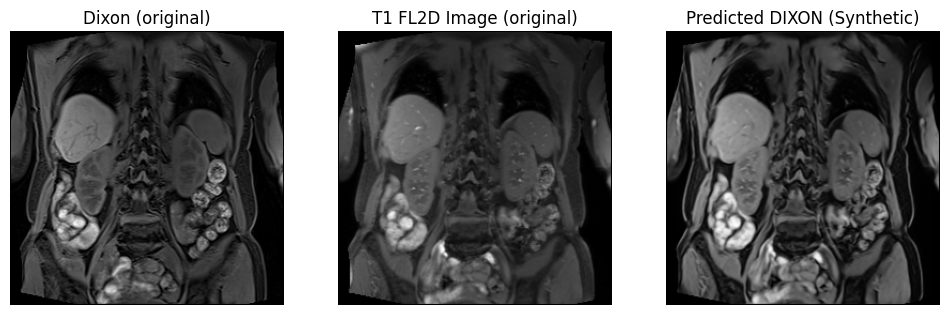

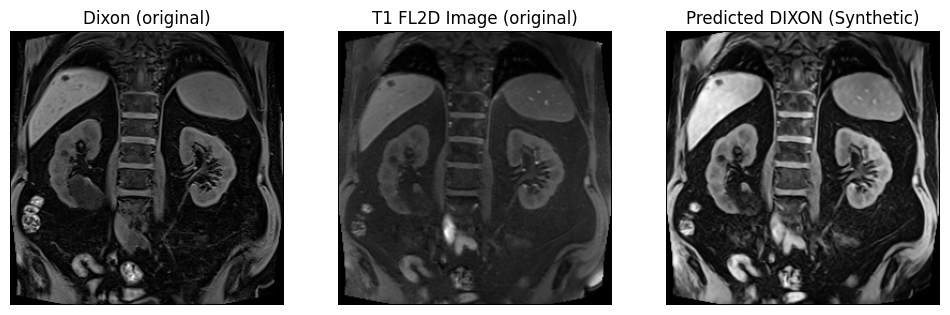

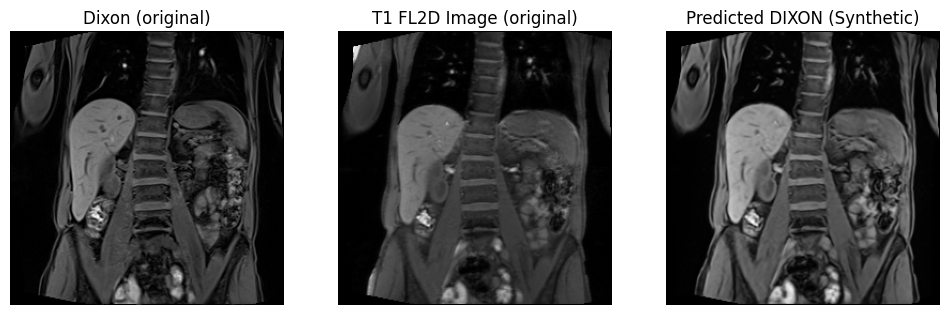

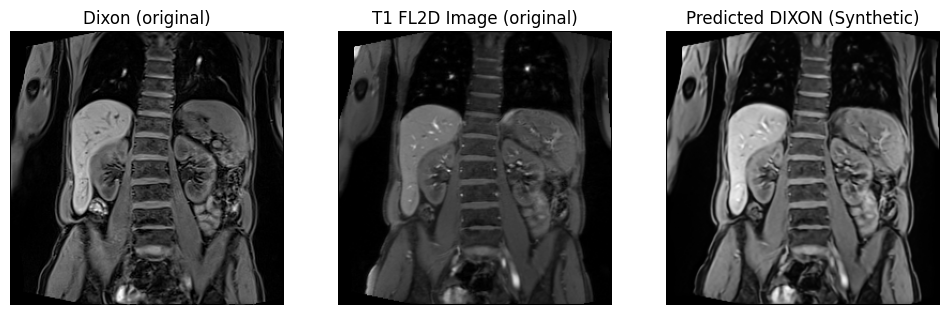

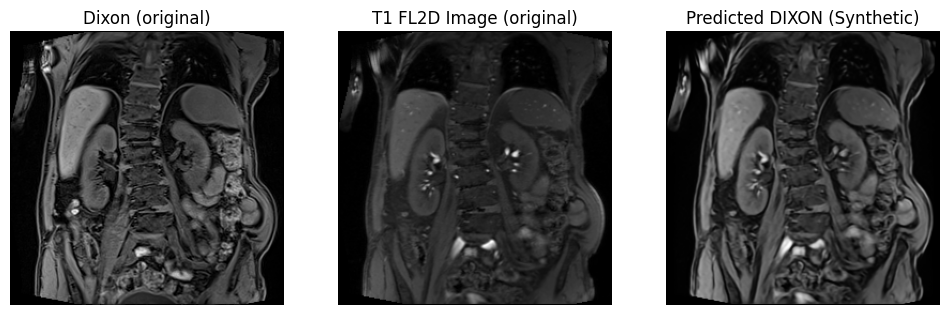

In [52]:
predict_and_show_some_samples(paired_dataset, model_t1_fl2d_dixon, train_args_t1_fl2d_dixon, predict_moving=True, num_samples=5, num_timesteps=4, device=device, normalize=True, contrast_name="T1 FL2D", normalize_output=False)


## Group Normalized T1 fl2d

In [4]:
checkpoint_path = "/home/students/studweilc1/SynDiff/my_results_group/exp_syndiff_T1fl2d3/content.pth"

model_t1_fl2d_dixon, train_args_t1_fl2d_dixon = load_net_Contrast_DIXON(checkpoint_path, device)
model_dixon_t1_fl2d, train_args_dixon_t1_fl2d = load_net_DIOXN_Contrast(checkpoint_path, device)

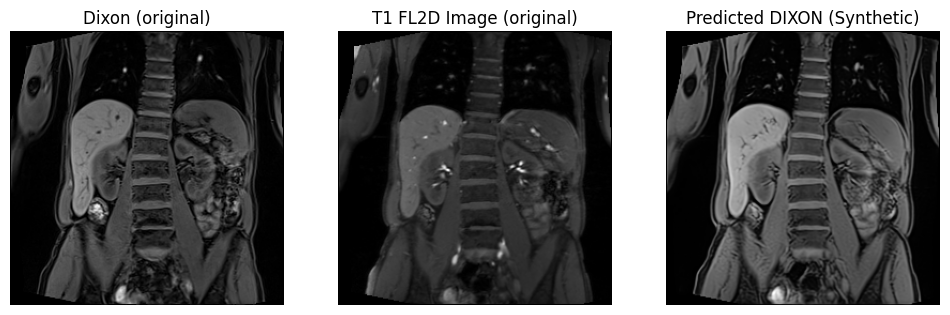

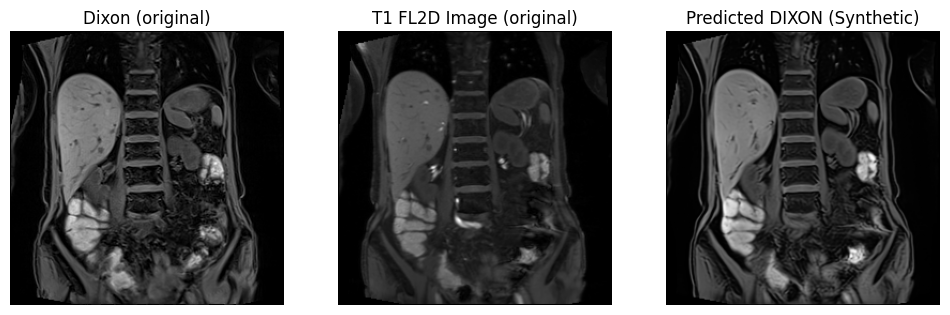

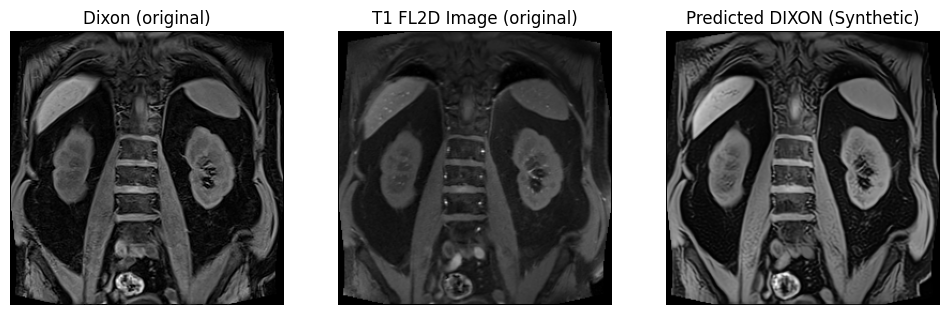

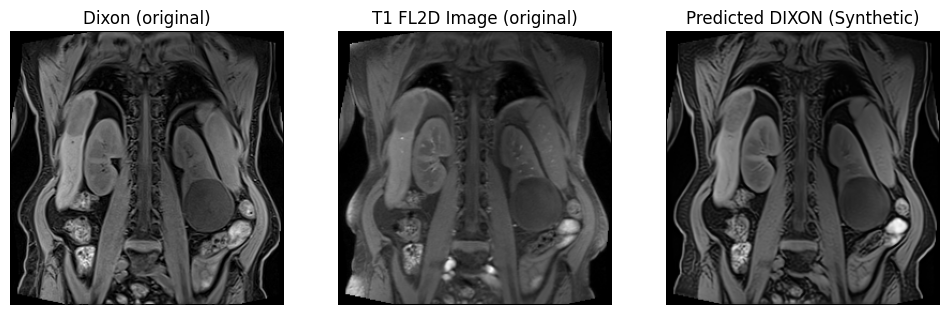

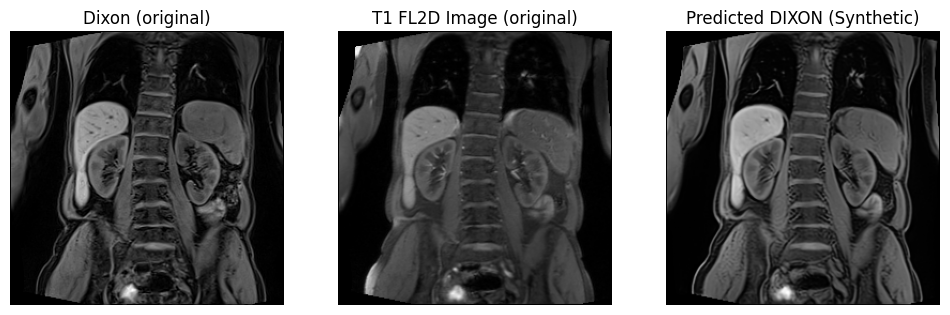

In [9]:
predict_and_show_some_samples(paired_dataset_group, model_t1_fl2d_dixon, train_args_t1_fl2d_dixon, predict_moving=True, num_samples=5, num_timesteps=4, device=device, normalize=True, contrast_name="T1 FL2D", normalize_output=False)

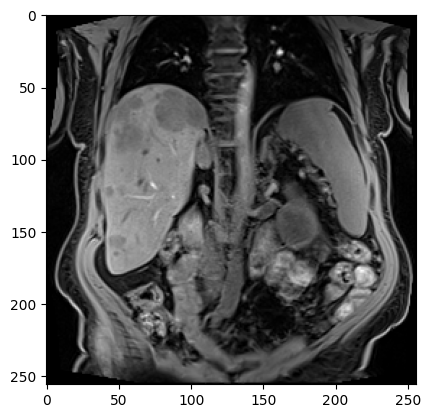

In [22]:
sample = paired_dataset_group[0]
img = sample["image_template"]
plt.imshow(img.squeeze(), cmap='gray')

## T1 fl2d longer

In [5]:
checkpoint_path = "my_results/exp_syndiff_T1fl2d/content.pth"

model_t1_fl2d_dixon, train_args_t1_fl2d_dixon = load_net_Contrast_DIXON(checkpoint_path, device)
model_dixon_t1_fl2d, train_args_dixon_t1_fl2d = load_net_DIOXN_Contrast(checkpoint_path, device)

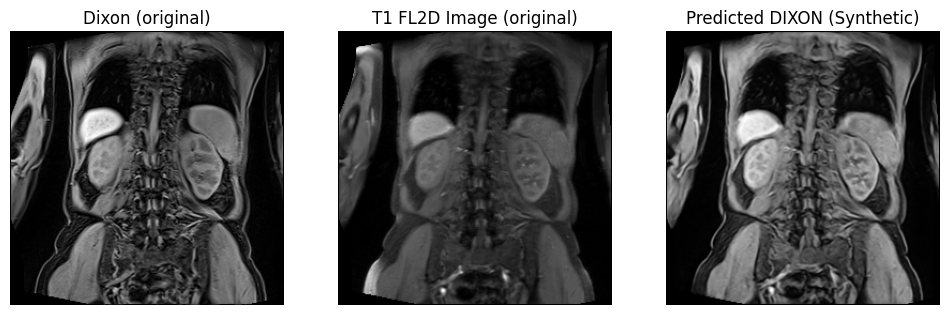

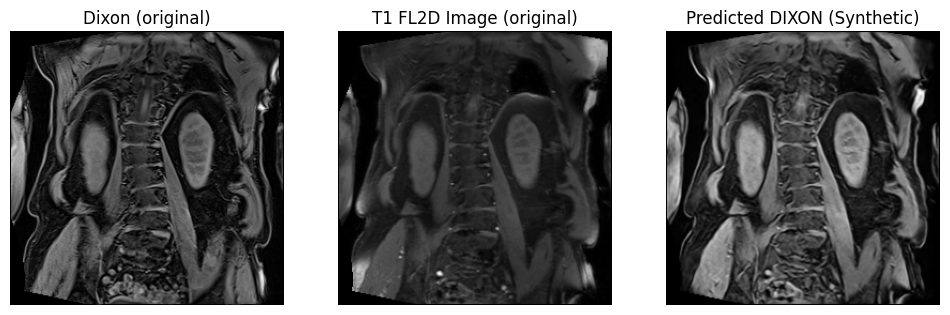

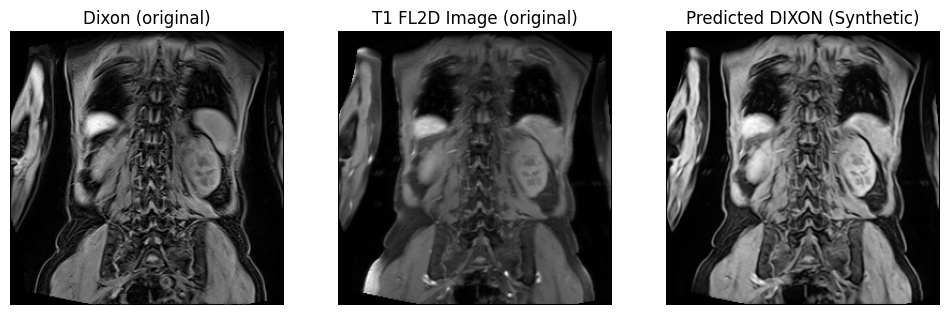

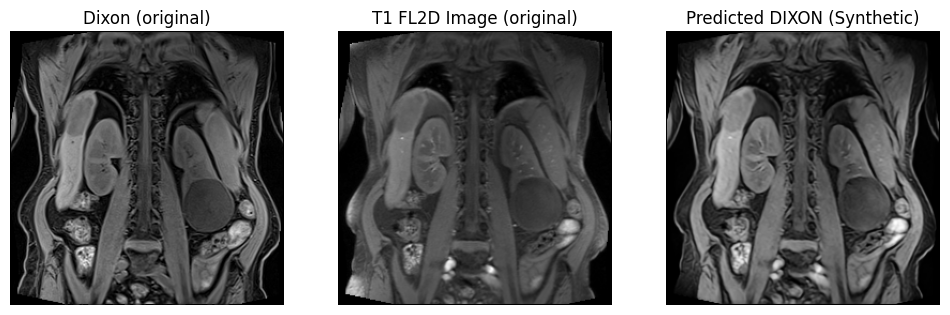

In [8]:
predict_and_show_some_samples(paired_dataset, model_t1_fl2d_dixon, train_args_t1_fl2d_dixon, predict_moving=True, num_samples=4, num_timesteps=12, device=device, normalize=True, contrast_name="T1 FL2D")

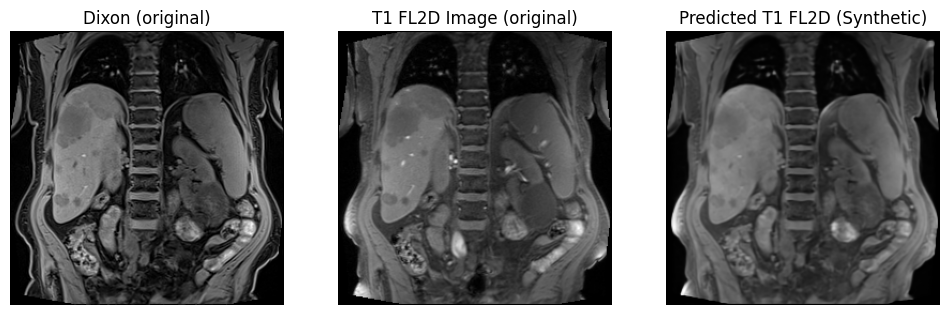

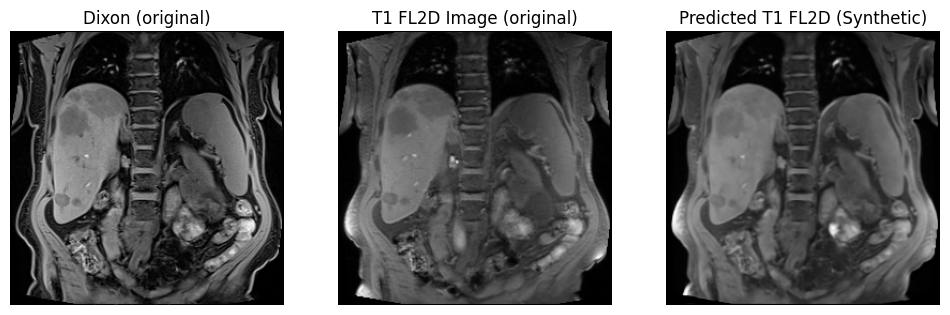

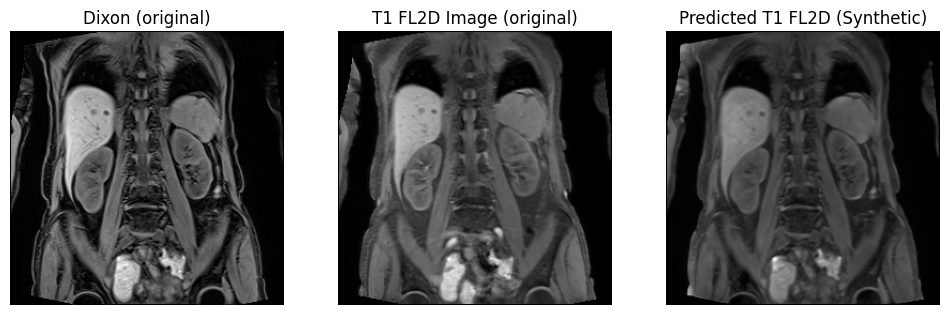

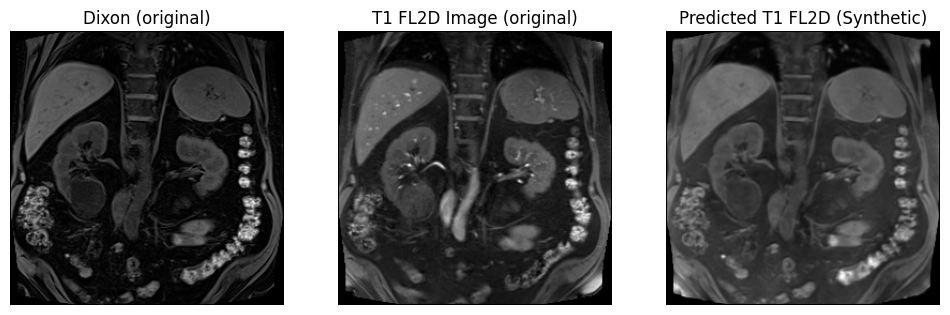

In [10]:
predict_and_show_some_samples(paired_dataset, model_dixon_t1_fl2d, train_args_dixon_t1_fl2d, predict_moving=False, num_samples=4, num_timesteps=12, device=device, normalize=True, contrast_name="T1 FL2D")

## T1 VIBE

In [11]:
checkpoint_path = "my_results/exp_syndiff_T1VIBE/content.pth"

model_t1vibe_dixon, train_args_t1vibe_dixon = load_net_Contrast_DIXON(checkpoint_path, device)
model_dixon_t1vibe, train_args_dixon_t1vibe = load_net_DIOXN_Contrast(checkpoint_path, device)

In [12]:
from pytorch_dataset import PairedHDF5ContrastDataset

cfg_transform = {
  "fit": [
    {"PerImageMinMaxNormalize": {}}
  ],
  "eval": [
    {"PerImageMinMaxNormalize": {}}

  ]
}

cfg_filters_dixon = {
  "contrast__in": ["DIXON"],
  "non_zero": True,
  "image_dim": 0,
  "image_type": "W",
  #"patient_id": "P_01_A",
  #"z_dim": 16,
  "split":"test",
}

cfg_filters_t1_vibe = {
  "contrast__in": ["T1_mapping_VIBE"],
  "non_zero": True,
  "image_dim": 0,
  "image_type": "FLIP2",
  #"patient_id": "P_01_A",
  #"z_dim": 16,
  "split":"test",
}

hdf5_path_dixon = "/home/students/studweilc1/SynthRegGAN/data/data_DIXON.h5"
hdf5_path_t1_vibe = "/home/students/studweilc1/SynthRegGAN/data/data_T1_mapping_VIBE.h5"

paired_dataset_t1_vibe = PairedHDF5ContrastDataset(
    hdf5_path_template=hdf5_path_dixon,
    hdf5_path_moving=hdf5_path_t1_vibe,
    filter_template=cfg_filters_dixon,
    filter_moving=cfg_filters_t1_vibe,
    transform_template=cfg_transform,
    transform_moving=cfg_transform,
)




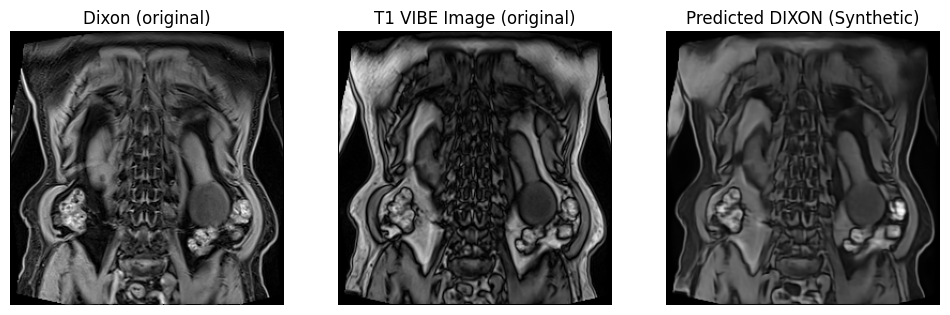

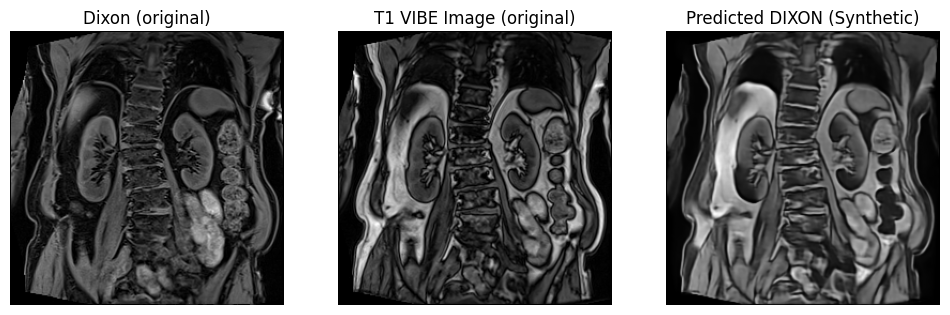

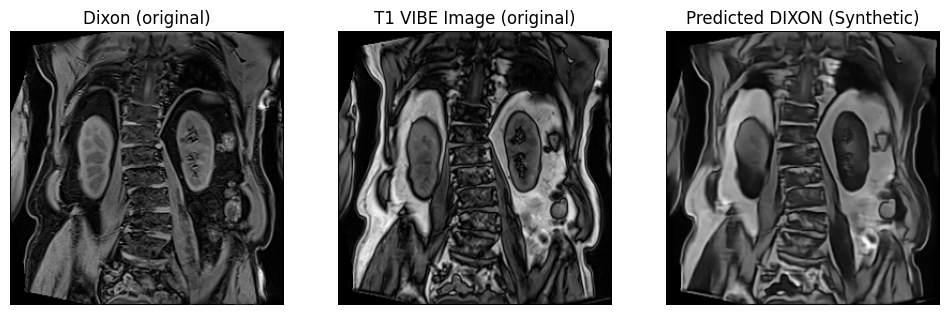

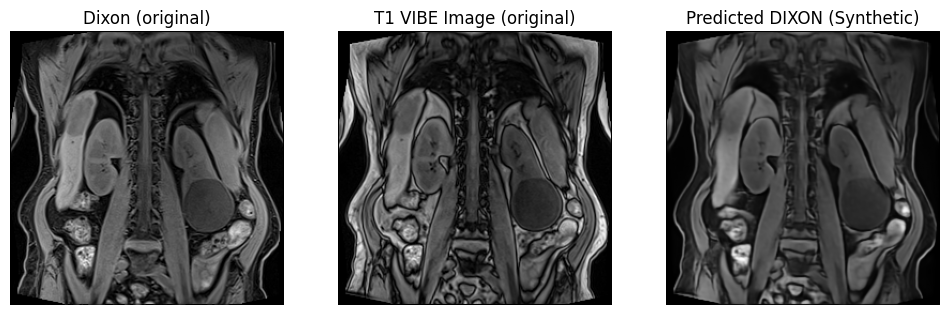

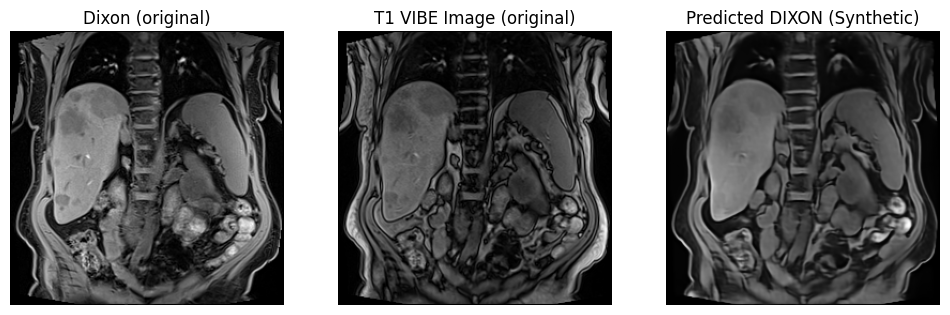

In [ ]:
predict_and_show_some_samples(paired_dataset_t1_vibe, model_t1vibe_dixon, train_args_t1vibe_dixon, predict_moving=True, num_samples=5, num_timesteps=4, device=device, normalize=True, contrast_name="T1 VIBE")

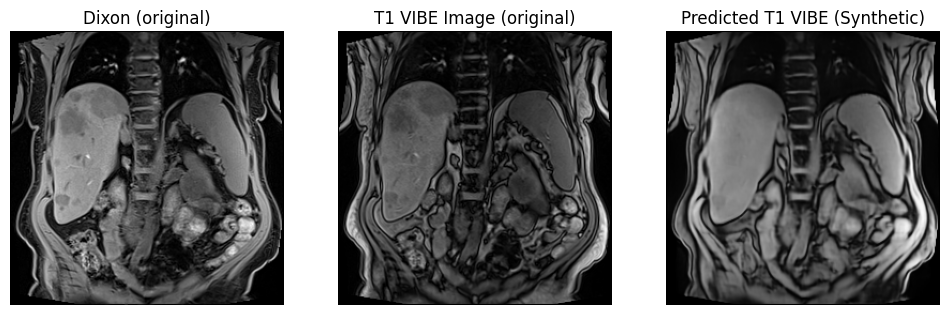

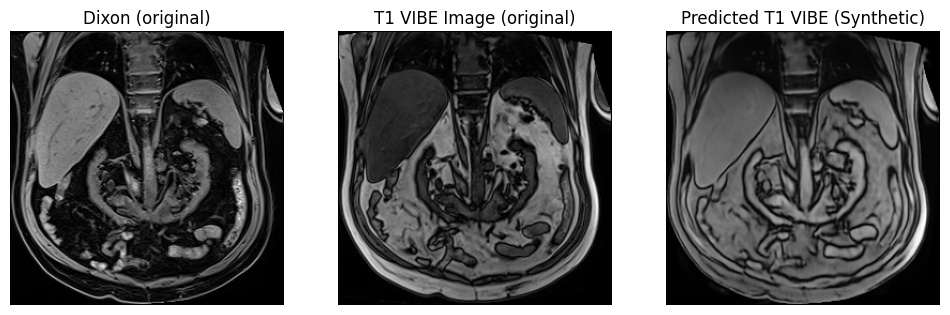

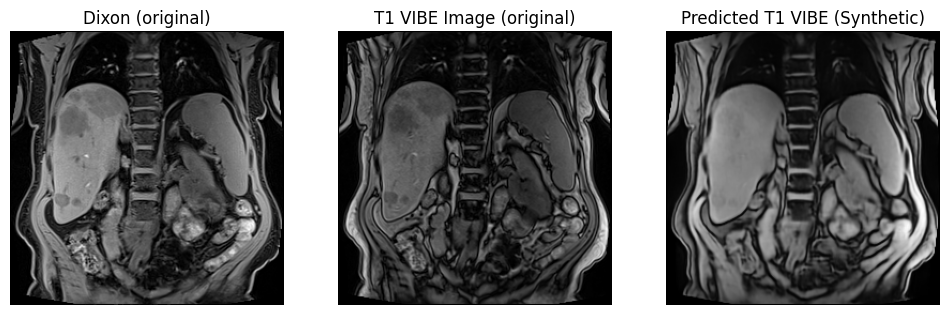

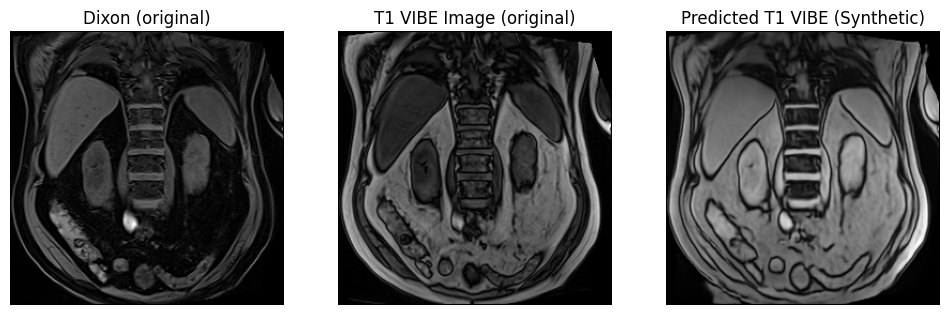

In [ ]:
predict_and_show_some_samples(paired_dataset_t1_vibe, model_dixon_t1vibe, train_args_dixon_t1vibe, predict_moving=False, num_samples=4, num_timesteps=4, device=device, normalize=True, contrast_name="T1 VIBE")

## ASL

In [11]:
from pytorch_dataset import PairedHDF5ContrastDataset

cfg_transform = {
  "fit": [
    {"PerImageMinMaxNormalize": {}}
  ],
  "eval": [
    {"PerImageMinMaxNormalize": {}}

  ]
}

cfg_filters_dixon = {
  "contrast__in": ["DIXON"],
  "non_zero": True,
  "image_dim": 0,
  "image_type": "W",
  #"patient_id": "P_01_A",
  #"z_dim": 16,
  "split":"test",
}

cfg_filters_asl = {
  "contrast__in": ["ASL"],
  "non_zero": True,
  "image_dim": 0,
  "image_type": "RBF",
  #"patient_id": "P_01_A",
  #"z_dim": 16,
  "split":"test",
}

hdf5_path_dixon = "/home/students/studweilc1/SynthRegGAN/data/data_DIXON.h5"
hdf5_path_asl = "/home/students/studweilc1/SynthRegGAN/data/data_ASL.h5"

paired_dataset_asl = PairedHDF5ContrastDataset(
    hdf5_path_template=hdf5_path_dixon,
    hdf5_path_moving=hdf5_path_asl,
    filter_template=cfg_filters_dixon,
    filter_moving=cfg_filters_asl,
    transform_template=cfg_transform,
    transform_moving=cfg_transform,
)




In [12]:
checkpoint_path = "my_results/exp_syndiff_ASL/content.pth"

model_asl_dixon, train_args_asl_dixon = load_net_Contrast_DIXON(checkpoint_path, device)
model_dixon_asl, train_args_dixon_asl = load_net_DIOXN_Contrast(checkpoint_path, device)

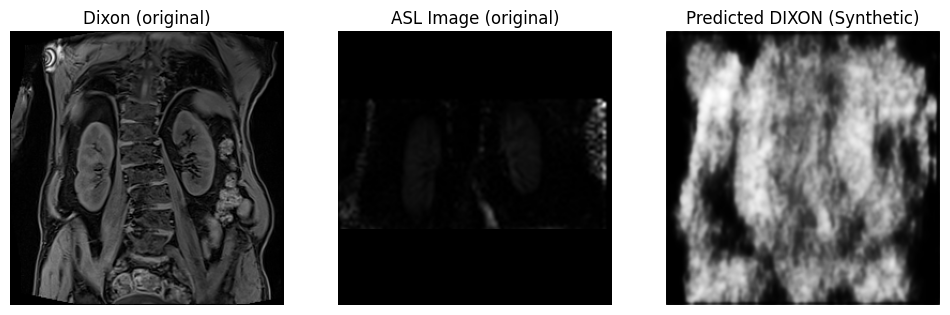

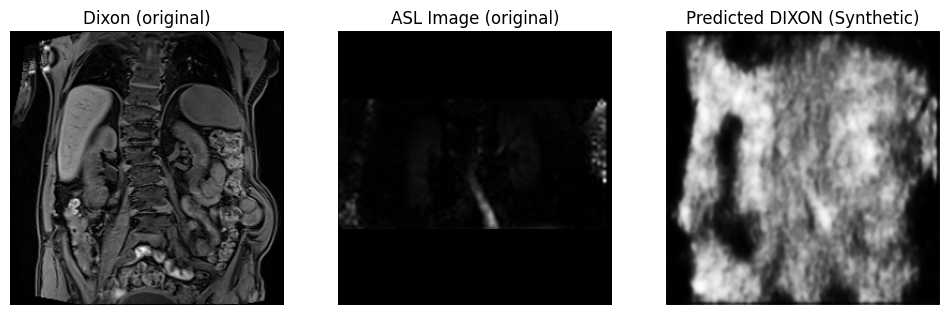

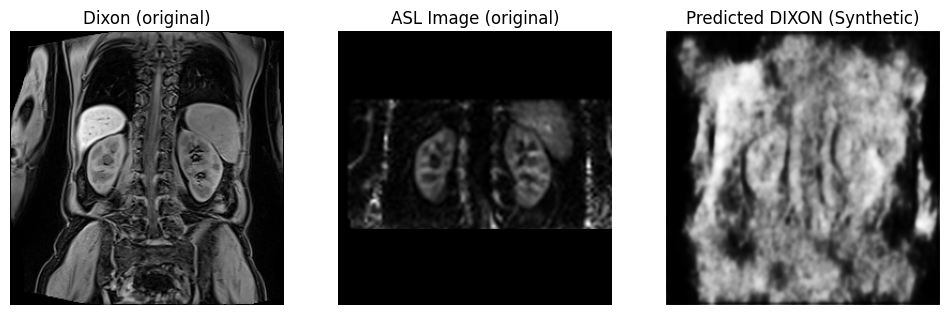

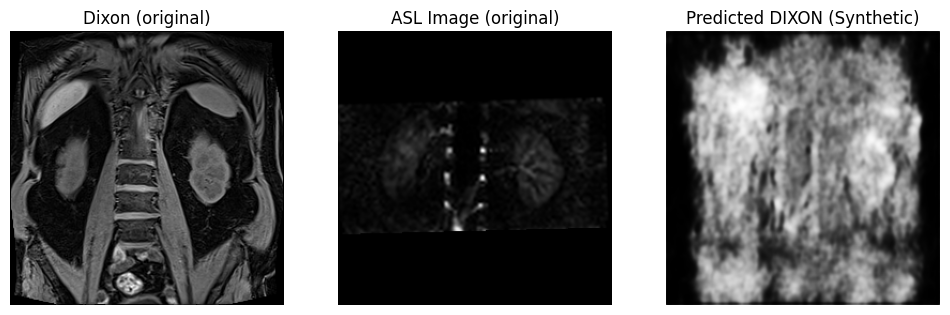

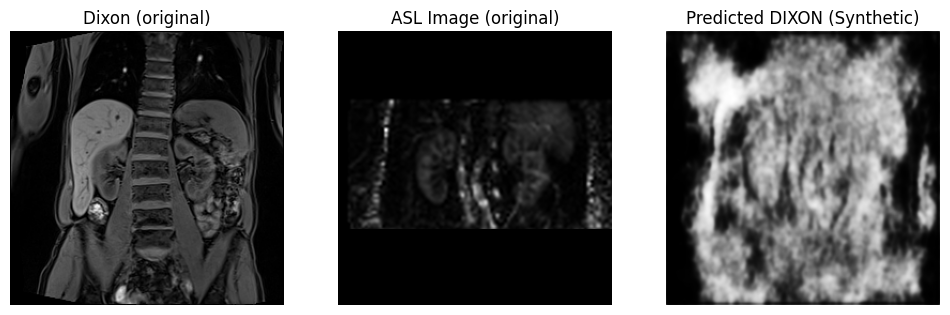

In [13]:
predict_and_show_some_samples(paired_dataset_asl, model_asl_dixon, train_args_asl_dixon,predict_moving=True, num_samples=5, num_timesteps=4, device=device, normalize=True, contrast_name="ASL")

## BOLD

In [3]:
from pytorch_dataset import PairedHDF5ContrastDataset

cfg_transform = {
  "fit": [
    {"PerImageMinMaxNormalize": {}}
  ],
  "eval": [
    {"PerImageMinMaxNormalize": {}}

  ]
}

cfg_filters_dixon = {
  "contrast__in": ["DIXON"],
  "non_zero": True,
  "image_dim": 0,
  "image_type": "W",
  #"patient_id": "P_01_A",
  #"z_dim": 16,
  "split":"test",
}

cfg_filters_bold= {
  "contrast__in": ["BOLD"],
  "non_zero": True,
  "image_dim": 0,
  "image_type": "s",
  #"patient_id": "P_01_A",
  #"z_dim": 16,
  "split":"test",
}

hdf5_path_dixon = "/home/students/studweilc1/SynthRegGAN/data/data_DIXON.h5"
hdf5_path_bold = "/home/students/studweilc1/SynthRegGAN/data/data_BOLD.h5"

paired_dataset_bold = PairedHDF5ContrastDataset(
    hdf5_path_template=hdf5_path_dixon,
    hdf5_path_moving=hdf5_path_bold,
    filter_template=cfg_filters_dixon,
    filter_moving=cfg_filters_bold,
    transform_template=cfg_transform,
    transform_moving=cfg_transform,
)




In [4]:
checkpoint_path = "my_results/exp_syndiff_BOLD/content.pth"

model_bold_dixon, train_args_bold_dixon = load_net_Contrast_DIXON(checkpoint_path, device)
model_dixon_bold, train_args_dixon_bold = load_net_DIOXN_Contrast(checkpoint_path, device)

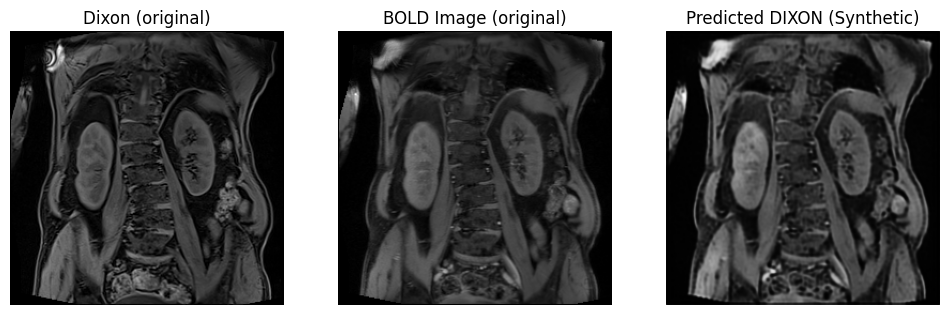

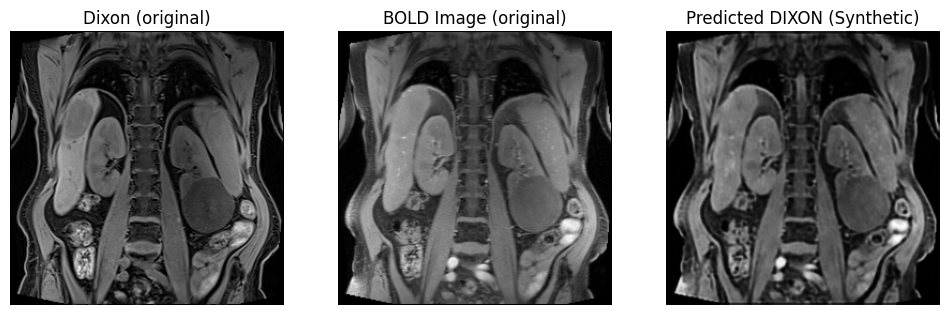

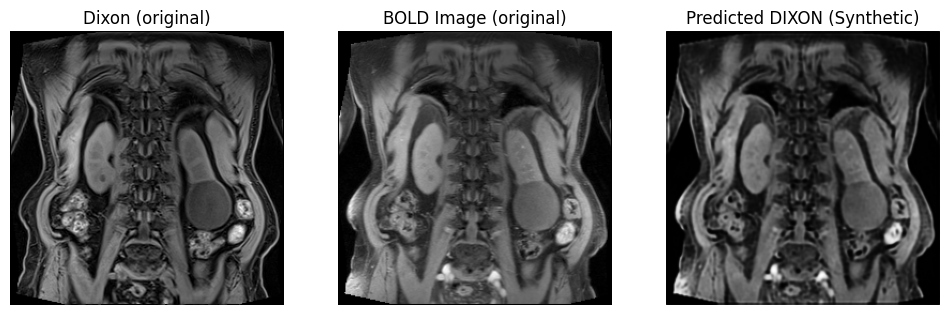

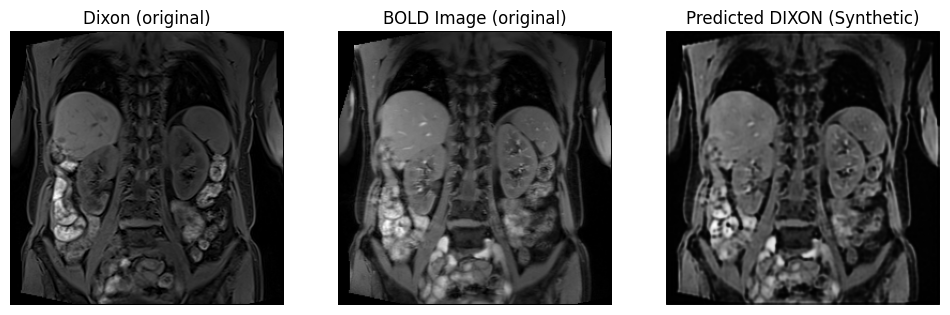

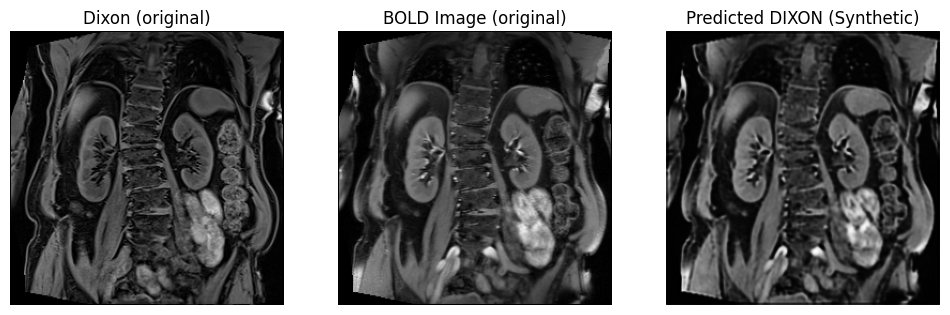

In [9]:
predict_and_show_some_samples(paired_dataset_bold, model_bold_dixon, train_args_bold_dixon, predict_moving=True, num_samples=5, num_timesteps=4, device=device, normalize=True, contrast_name="BOLD")

# Visualize Losses

In [ ]:
test = np.load("/home/students/studweilc1/SynDiff/my_results_group/exp_syndiff_T1fl2d/val_l1_loss.npy")

for i in range(9):
    plt.plot(test[0,i,:])
plt.show()

means = np.mean(test, axis=2)
plt.plot(means[0][:9])

Plotting losses for experiment path: /home/students/studweilc1/SynDiff/my_results/exp_syndiff_T1fl2d/


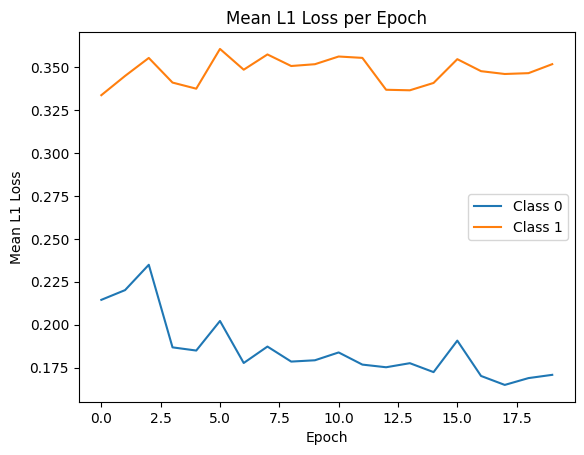

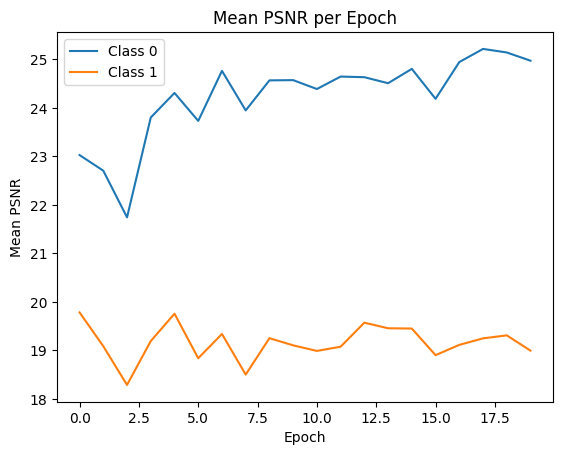

Plotting losses for experiment path: /home/students/studweilc1/SynDiff/my_results_group/exp_syndiff_T1fl2d/


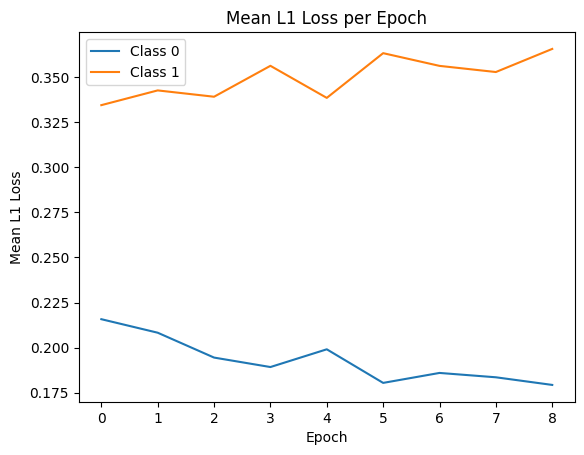

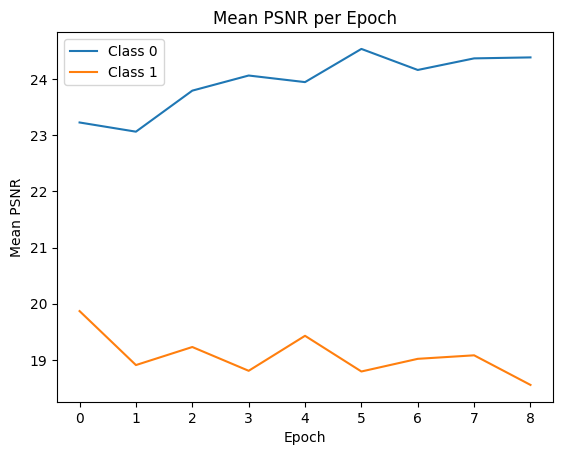

Plotting losses for experiment path: /home/students/studweilc1/SynDiff/my_results_brats/brats_exp


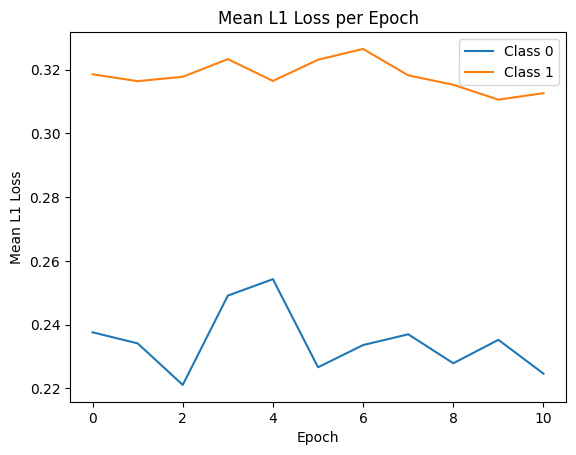

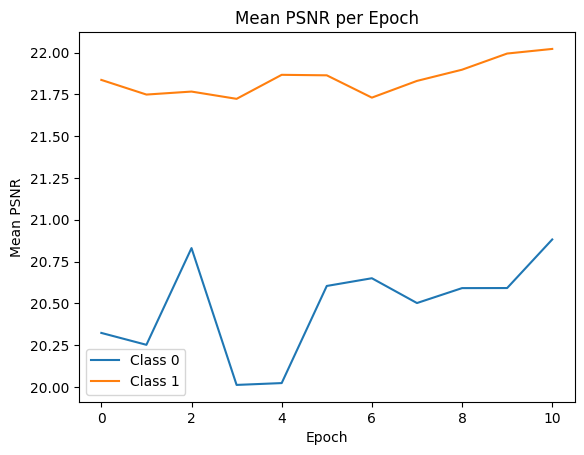

Plotting losses for experiment path: /home/students/studweilc1/SynDiff/my_results_group/exp_syndiff_T1fl2d3/


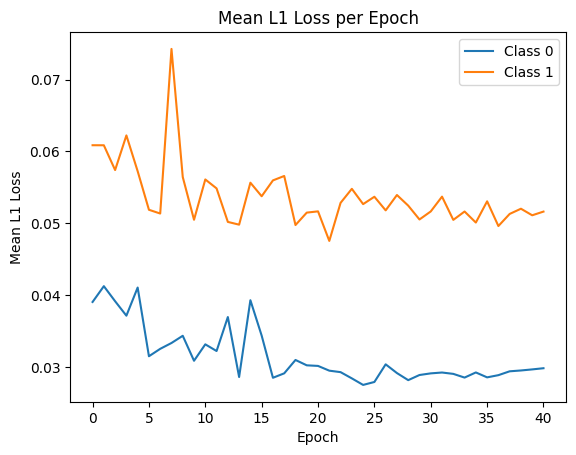

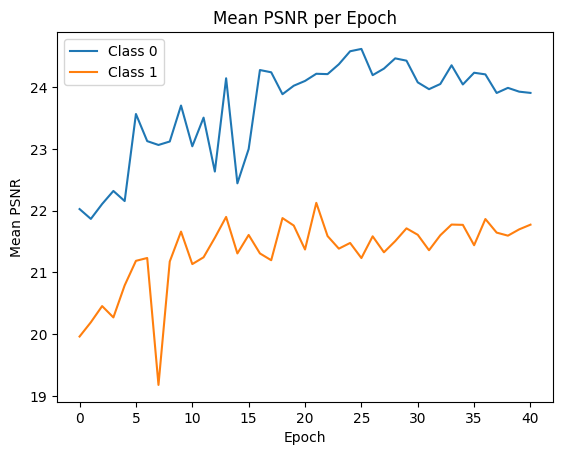

In [11]:
exp_path_t1 = "/home/students/studweilc1/SynDiff/my_results/exp_syndiff_T1fl2d/"
exp_path_t1_group = "/home/students/studweilc1/SynDiff/my_results_group/exp_syndiff_T1fl2d/"
exp_path_t1_group2 = "/home/students/studweilc1/SynDiff/my_results_group/exp_syndiff_T1fl2d3/"
exp_path_brats = "/home/students/studweilc1/SynDiff/my_results_brats/brats_exp"

def plot_losses(exp_path_t1):
    print("Plotting losses for experiment path:", exp_path_t1)
    val_l1_loss = np.load('{}/val_l1_loss.npy'.format(exp_path_t1))
    val_psnr_values = np.load('{}/val_psnr_values.npy'.format(exp_path_t1))

    mean_val_l1_loss_0 = [x for x in val_l1_loss.mean(axis=2)[0] if x != 0]
    mean_val_l1_loss_1 = [x for x in val_l1_loss.mean(axis=2)[1] if x != 0]

    mean_val_psnr_0 = [x for x in val_psnr_values[0].mean(axis=1) if x != 0]
    mean_val_psnr_1 = [x for x in val_psnr_values[1].mean(axis=1) if x != 0]

    plt.plot(mean_val_l1_loss_0, label="Class 0")
    plt.plot(mean_val_l1_loss_1, label="Class 1")
    plt.xlabel("Epoch")
    plt.ylabel("Mean L1 Loss")
    plt.title("Mean L1 Loss per Epoch")
    plt.legend()
    plt.show()

    plt.plot(mean_val_psnr_0, label="Class 0")
    plt.plot(mean_val_psnr_1, label="Class 1")
    plt.xlabel("Epoch")
    plt.ylabel("Mean PSNR")
    plt.title("Mean PSNR per Epoch")
    plt.legend()
    plt.show()

def compare_losses(exp_path_exp1, exp_path_exp2):
    print("Comparing losses for experiment paths:", exp_path_exp1, "and", exp_path_exp2)
    val_l1_loss_exp1 = np.load('{}/val_l1_loss.npy'.format(exp_path_exp1))
    val_l1_loss_exp2 = np.load('{}/val_l1_loss.npy'.format(exp_path_exp2))
    
    val_psnr_values_exp1 = np.load('{}/val_psnr_values.npy'.format(exp_path_exp1))
    val_psnr_values_exp2 = np.load('{}/val_psnr_values.npy'.format(exp_path_exp2))

    mean_val_l1_loss_exp1_0 = [x for x in val_l1_loss_exp1.mean(axis=2)[0] if x != 0]
    mean_val_l1_loss_exp1_1 = [x for x in val_l1_loss_exp1.mean(axis=2)[1] if x != 0]
    mean_val_l1_loss_exp2_0 = [x for x in val_l1_loss_exp2.mean(axis=2)[0] if x != 0]
    mean_val_l1_loss_exp2_1 = [x for x in val_l1_loss_exp2.mean(axis=2)[1] if x != 0]

    mean_val_psnr_exp1_0 = [x for x in val_psnr_values_exp1[0].mean(axis=1) if x != 0]
    mean_val_psnr_exp1_1 = [x for x in val_psnr_values_exp1[1].mean(axis=1) if x != 0]
    mean_val_psnr_exp2_0 = [x for x in val_psnr_values_exp2[0].mean(axis=1) if x != 0]
    mean_val_psnr_exp2_1 = [x for x in val_psnr_values_exp2[1].mean(axis=1) if x != 0]

    plt.plot(mean_val_l1_loss_exp1_0, label="Exp1 Class 0")
    plt.plot(mean_val_l1_loss_exp1_1, label="Exp1 Class 1")
    plt.plot(mean_val_l1_loss_exp2_0, label="Exp2 Class 0")
    plt.plot(mean_val_l1_loss_exp2_1, label="Exp2 Class 1")
    plt.xlabel("Epoch")
    plt.ylabel("Mean L1 Loss")
    plt.title("Mean L1 Loss per Epoch")
    plt.legend()
    plt.show()

    plt.plot(mean_val_psnr_exp1_0, label="Exp1 Class 0")
    plt.plot(mean_val_psnr_exp1_1, label="Exp1 Class 1")
    plt.plot(mean_val_psnr_exp2_0, label="Exp2 Class 0")
    plt.plot(mean_val_psnr_exp2_1, label="Exp2 Class 1")
    plt.xlabel("Epoch")
    plt.ylabel("Mean PSNR")
    plt.title("Mean PSNR per Epoch")
    plt.legend()
    plt.show()




plot_losses(exp_path_t1)
plot_losses(exp_path_t1_group)
plot_losses(exp_path_brats)
plot_losses(exp_path_t1_group2)


Comparing losses for experiment paths: /home/students/studweilc1/SynDiff/my_results_group/exp_syndiff_T1fl2d/ and /home/students/studweilc1/SynDiff/my_results_group/exp_syndiff_T1fl2d3/


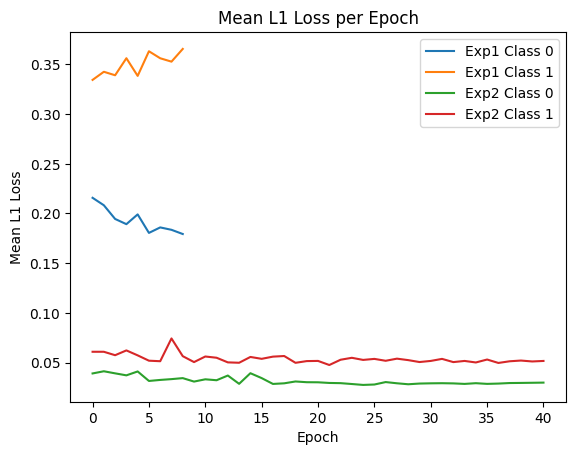

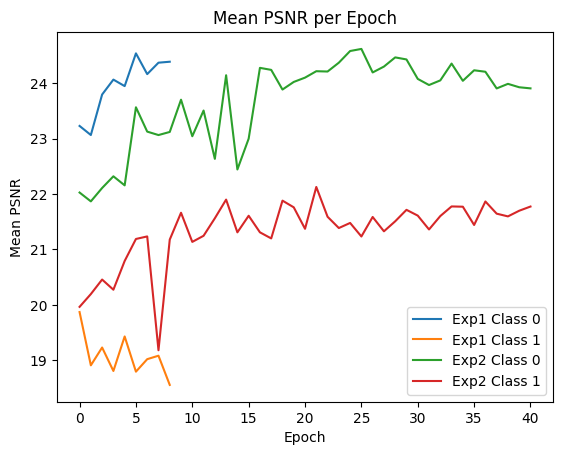

In [12]:
compare_losses(exp_path_t1_group, exp_path_t1_group2)

In [ ]:
i